# **Dataset Import**

In [ ]:
import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'star-dataset:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F391127%2F754362%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240808%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240808T232310Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D2e039fc610960efad81d1ec92b66f4657ee7fd14d53391d2579190cfdf7bd068c4dfe0bfa87f87b27a9ce06bd50d95752b59bb2c588b9e507f26a7879b2f36c623b942fa8d21c5e6b3c81aed804992a665426521a5d370a9086666c8d7ff834a8836bbdbbac64455de0f2b2abe179e9b48703b56e17c2c22ab6fa9bf3daea502c14d87067fc28104582158db8dc9650ee1ce6fa6c3e96ba5bebd28d31621916e1cbea7d9c21c19550dffc495d1c3e236ae85cdd732d9ae78e2aef90bff7aa7e8db2aca6b12a624ab238b31988c04274d757d68d0f6f30ac1c5d86dac22a4e87b6a636d856849d770f7da73247816377bea9fe65949bdd5dfd2db5a6057d7d796,star-categorization-giants-and-dwarfs:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F837828%2F1433961%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240808%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240808T232311Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D2879a81e35d03d4b758aebd867812fa47edf272b8329b1c3be9e0420910d06d433f3f764a551e15f58b12c883eaa034a07707db75ef631f1f73e9c17ce6b21a64a8c746054b31ea5c54179ad45fcc8e286d30c8c1ec1171478ab366d873e81f26db2fefa071d21f575be49cd83a8884213547cba7e289231a413fd13bd5e3a05b7ab28d2cd4d0488bbef4f3e621a2d74f874d21ec4daecae1a9d7c62c48265905eab0a59bd42a78ba6c222da77faa06243d20c100e88b02954b12dafb7d41dcf6f77818b2cf5ef744c075c0f2113203980e3bfe88f454f29c180a352ba0becf6e5ec1e3e9d47507c4147fd2765410f032eb841870c12f9ee468e5f12def241b6,black-holes-observed-so-far-nasa-esa:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F1459402%2F2412485%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240808%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240808T232311Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D51b2a2534a5dee1f2ee5e693b082d46a71bb409d9980a271bcc180d62ee54f1c5b85f4471ebaf2c67eb61398a12a31c42f6fe037c15e92028a3ef994ac425d8caf7029e30d14d7acc4c74976f84e7d8becbca9535187848c2f7669569f61b4e110768f7ded8859dcc3bca261b3c4eda08a2800a1088975178c09a9ef78e38600d4608dd81be4240a14c6ff2707323de84a375980dfe9ba0cfcaf0030ba3334217cb2e6ab5c326b0028f7312c2cbbc03010ffdf7ed5aed8369b2fcfb1e9d9cf6412d3ddd453c9dab4429b7feb64a0d93e66ce339dcfcf877f59305e8881dccd0a82af7071914a605c3119f680aeadc915f69ce5479e5a0ef5ded4857162aaf435,m87-galaxycenter-objectsblack-holeesa:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F1462723%2F2417554%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240808%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240808T232311Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D15f0ba0d92cb774b752a826f71aa78124ec2f00fe9441ebf64fff0dd0fbba3c73e24d0c98716dcb650906f4aabd91f2e9009f4fed94235cc25cbc77f36e8c33074b061966b9bfabc43f05350df039e3bba881acc40be6188fed35f2e05db1b01974013423b8d065bfda57ee7b379ed23a86fd38794b44da592ee20486c9011e332169277251ab091ee5abb7774071ee6ae9356011ffc06a9f9baa39bc6dcec534c3437fb4d954ff4b1fe75238632c531ad9ad66d903c0e5cde8993fcea2d403f36ffca8762e031d238f22e1bc691f87b7e3b80f77f6d9c5a68d9c9b1c0814822545b05606534e5c87e4ef62526ad5f93f6710427820ac309662c04f3c24aa6cb,star-images:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F1784971%2F2912109%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240808%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240808T232311Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D1a5366fda3493ea16c0f2dd5d5c7dced2a5cc0f26aa53fa8ca705d05db4fa18bc02597c235c9a9ce87eef4e78e22fcd846a8b6bb8026ea12cf03b133a7d1b418d8971bfdbbfe2ae6f31696a2bfe54fe623e8c73c5ada92d6f3e84f26eb0963f02e3d882d2df5e1b06ee2da441652d505d5907986901f66cdb442244698bbf73d1c3ae83014935c7e80e1d2352bddabc13c211044dd61d2344e4780157084ef5ac46d2ac5d86bba9c73c6ea2bda6019c9b64b784f2daaadb84a6d779bd3692931a1e90cc67a7ec65c77b8877ed6e59e0a6d806829869d76a9a64c506635117a380b7f8e5e5a2f1b6712060663f4958795b400b38b16472400f51e660861e9dd3e,stellar-classification-dataset-sdss17:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F1866141%2F3047436%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240808%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240808T232311Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D121b8b2f44be3bada9d299f21cfdb02a0d9460bcbb8cccb8096ff4bd6c532bd08228afd876ff10fec47ddcb28823bd7419cbae89124b762eb9f791ebf20eedb7481d0b9127601d1beeaffbe534729fafa7a7c3d4250f933ae290b7a18ba3e77c595ea6bf4643e54edeade23efac4d01af5c10765151dc04e7796d8ad647d669a496988591f17abaf23a3c52d6f24aa4a6e81e8078c2f394d6ddb72639990862d5c965b938394b6da08b665e3d44b8f41357afefad30c28c44b1d45ad7e2f4647bba50f36edcf4f69df3eb05e7d74ae1a7cf11ef0fab8550574b47a38b852f1a47329c715419d5e75987810a443f28b44a46a866e424ca0e11d12488dd81d9bbb'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input/star-categorization-giants-and-dwarfs'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [ ]:
pip install catboost

In [ ]:
pip install lightgbm

# **Data Visualization/Analysis, Feature Engineering, Scientific Background**


## **Black Hole Background**


A black hole is an area of space with such intense gravity that nothing, not even light can escape. The term **black hole** refers to a space where light cannot escape, giving it its appearance of being completely dark.

When extremely massive stars collide at the end of their lives, black holes are created. A dying star collapses in on itself as a result of gravity taking over when its internal pressure is lost. The star's core will eventually turn into a black hole if the star is large enough to support such a collapse.

<div style="text-align:center;">
    <img style="text-align:center; border: 0.5px solid black; padding: 5px;" src="https://upload.wikimedia.org/wikipedia/commons/0/03/Black_hole_lensing_web.gif" alt="Black Hole Lensing" width="400">
</div>

> *Animated simulation of a <a href="/wiki/Schwarzschild_black_hole" class="mw-redirect" title="Schwarzschild black hole">Schwarzschild black hole</a> with a galaxy passing behind. Around the time of alignment, extreme <a href="/wiki/Gravitational_lens" title="Gravitational lens">gravitational lensing</a> of the galaxy is observed.
(**Source:** [Wikipedia](https://en.wikipedia.org/wiki/Black_hole))*


A black hole is a very dense object. A black hole can have a mass that is billions or trillions of times greater than that of the Sun while still fitting into an area only a few kilometers across.

It's gravity is so powerful that it can distort spacetime. The universe's fabric, spacetime, is what enables us to travel through space and time. It can appear as though time is slowing down or even stopping when spacetime is warped.

When observing black hole creation, scientists search for a few specific things:

* **Gamma-ray bursts:** The most potent explosions in the universe are known as gamma-ray bursts. They are believed to result from the merger of huge stars with black holes.

* **X-ray emissions:** Material that is heated, like the accretion disk that surrounds a black hole, emits X-rays.

* **Radio waves:** The matter that is ejected from a black hole during its development may emit radio waves.

* **Optical emissions:** Material that falls into a black hole and is heated up may emit optical emissions.

Since we'll be using the Kaggle Dataset M87 Galaxy-Center Objects/Black Hole/ESA, which includes all the Black Hole data from the M87 Galaxy, it is important to note that no single observation can definitively confirm the formation of a black hole from a star dataset.

When using star datasets to study Black Hole creation, there are few things to observe carefully:

* **Changes in the star's brightness:** A star's brightness will change when it starts to collapse because the fusion events in its core are intensifying. When the star grows more opaque and less light can escape, this brightness will eventually fall.

* **Spectral changes in the star:** A star's spectrum is a graph showing the intensity of its light at various wavelengths. Due to changes in temperature and composition, a star's spectrum will shift when it starts to collapse.
* **Variations in the star's velocity:** A star's velocity will rise when it starts to collapse because of the growing gravitational force of the collapsing core. By monitoring the star's spectral lines' Doppler shift, one can identify this rise in velocity.

<div style="text-align:center;">
    <img style="text-align:center; border: 0.5px solid black; padding: 5px;" src="https://svs.gsfc.nasa.gov/vis/a010000/a013300/a013326/BH_AccretionDisk_Sim_360_Continuous.gif" alt="Black Hole Lensing" width="300">
</div>

> *Continuous full rotation of Black Hole by NASA’s Goddard Space Flight Center/Jeremy Schnittman.
(**Source:** [NASA](https://svs.gsfc.nasa.gov/13326))*


The data from the Event Horizon Telescope (EHT), which was used to image the black hole at the center of the M87 galaxy, are included in the Kaggle Dataset M87 Galaxy-Center Objects/Black Hole/ESA.

By searching for the following, this information can be utilized to study how black holes form:

<div style="text-align:center;">
    <img style="text-align:center; border: 0.5px solid black; padding: 5px;" src="https://svs.gsfc.nasa.gov/vis/a010000/a013300/a013326/BH_labeled.jpg" alt="Black Hole Lensing" width="1000">
</div>

> *This illustration shows how direct and bent light rays from a black hole's accretion disk produce the apparent image and motion seen by an observer with a credit of NASA’s Goddard Space Flight Center/Jeremy Schnittman.
(**Source:** [NASA](https://svs.gsfc.nasa.gov/13326))*


**the existence of an accretion disk:** As a black hole absorbs matter from its surrounds, an accretion disk, or disk of material, forms around it. By observing the emission of X-rays and other types of electromagnetic radiation from the disk, one can deduce the existence of an accretion disk.

**the existence of a shock wave:** When material enters a black hole, it creates a shock wave, which is a wave of compressed gas. By keeping an eye on the black hole's radio wave emission, it is possible to determine whether or not a shock wave is there.

**The presence of a jet:** A jet is a stream of matter that is released from a black hole at a high rate of speed. By studying the black hole's emission of high-energy gamma rays, one can deduce the existence of a jet.

It is important to remember that no single observation from the Kaggle Dataset M87 Galaxy-Center Objects/Black Hole/ESA can conclusively prove the creation of a black hole. *(**Source:** [NewScientist](https://www.newscientist.com/article/2320264-whats-next-for-event-horizon-telescope-after-its-black-hole-pictures/) | [SciTechDaily](https://scitechdaily.com/nasa-tracking-supermassive-black-holes-on-collision-course/?expand_article=1) | [Britannica](https://www.britannica.com/science/astronomical-observatory))*

Observing black hole creation presents a number of difficulties, as shown by the Kaggle Dataset M87 Galaxy-Center Objects/Black Hole/ESA:

* **The complexity of the data:** Because of the data's intricacy, it is challenging to spot the minute variations that might point to the creation of black holes.

* **The limited amount of data:** Due to the restricted spatial and temporal resolution of the EHT data, it is challenging to see the precise dynamics of black hole generation.

* **The presence of noise:** The EHT data is also tainted with noise, which can make it challenging to spot genuine indications from black hole creation.

**Note:** Based on the Kaggle Star Dataset for Stellar Classification attributes, it is not possible to directly detect a black hole formation as we will be using this dataset for now. The attributes provided are for stellar classification, which is the process of classifying stars based on their properties, such as their temperature, luminosity, and spectral type.

## Dataset Observation

In [ ]:
# Dataset Preview

import pandas as pd

# path = "/kaggle/input/star-categorization-giants-and-dwarfs/Star39552_balanced.csv"

path = "/kaggle/input/star-categorization-giants-and-dwarfs/Star99999_raw.csv"

df = pd.read_csv(path)
df = df.drop(df.columns[0], axis=1)

df.head(5)

print(df)

In [ ]:
# Convertion of Columns Data Types into Floating Values

df["Vmag"] = pd.to_numeric(df["Vmag"], downcast="float", errors='coerce')
df["Plx"] = pd.to_numeric(df["Plx"], downcast="float", errors='coerce')
df["e_Plx"] = pd.to_numeric(df["e_Plx"], downcast="float", errors='coerce')
df["B-V"] = pd.to_numeric(df["B-V"], downcast="float", errors='coerce')

In [ ]:
pip install sweetviz

In [ ]:
# Data Report and Visualization

import sweetviz as sv

ReportVisualizationPartTwo = sv.analyze(df)
ReportVisualizationPartTwo.show_notebook()

In [ ]:
# Debug Purpose
df = df.dropna()

print(df)

## Data Modification

**Reducing e_Plx Error:** To reduce the error rate in the dataset, specifically for the e_Plx values representing the standard error of the parallax (Plx - Distance Between the Star and the Earth), we should drop rows with high standard errors in e_Plx.

<div style="text-align:center;">
    <img style="text-align:center; border: 0.5px solid black; padding: 5px;" src="https://upload.wikimedia.org/wikipedia/commons/7/7d/Stellarparallax_parsec1.svg" width="220" height="345">
</div>



> *Stellar parallax is the basis for the <a href="https://en.wikipedia.org/wiki/Parsec" title="Parsec">parsec</a>, which is the distance from the <a href="https://en.wikipedia.org/wiki/Sun" title="Sun">Sun</a> to an <a href="https://en.wikipedia.org/wiki/Astronomical_object" title="Astronomical object">astronomical object</a> that has a <a href="https://en.wikipedia.org/wiki/Parallax" title="Parallax">parallax</a> angle of one <a href="https://en.wikipedia.org/wiki/Arcsecond" class="mw-redirect" title="Arcsecond">arcsecond</a>. (1 <a href="https://en.wikipedia.org/wiki/Astronomical_unit" title="Astronomical unit">AU</a> and 1 parsec are not to scale, 1 parsec = ~206265 AU)
(**Source:** [Wikipedia](https://en.wikipedia.org/wiki/Stellar_parallax))*

In [ ]:
df.describe()

,Vmag,Plx,e_Plx,B-V
count,96742.000000,96742.000000,96742.000000,96742.000000
mean,8.291884,7.105202,1.264169,0.700666
std,1.248016,11.145690,1.156238,0.490060
min,-1.440000,-35.099998,0.380000,-0.400000
25%,7.610000,2.520000,0.870000,0.342000
50%,8.400000,4.600000,1.080000,0.605000
75%,9.070000,8.270000,1.360000,1.072000
max,13.610000,772.330017,69.070000,5.460000


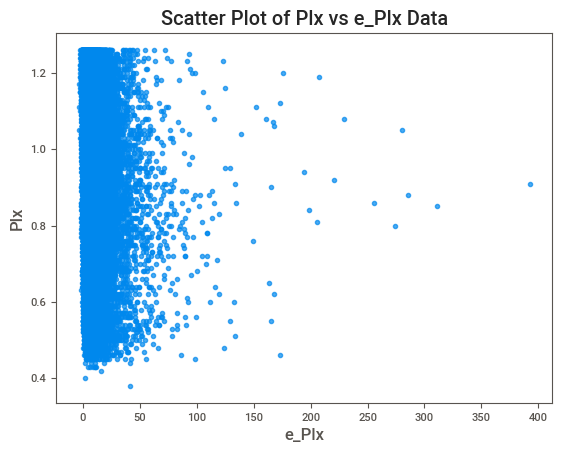

In [ ]:
# Reducing e_Plx Errors

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler, MaxAbsScaler, Normalizer

# Standardization (Z-score normalization)
# standard_scaler = StandardScaler()
# df['Plx'] = standard_scaler.fit_transform(df[['Plx']])

# Dropped Rows Where e_Plx is Extreme High

df = df.drop(df[df['e_Plx'] > df['e_Plx'].mean()].index)

# Scatter Plot of Reduced e_Plx Data
# plt.scatter(df['Plx'], df['Vmag'], c=df['TargetClass'], alpha=0.7)

plt.scatter(df['Plx'], df['e_Plx'], alpha=0.7)

plt.ylabel('Plx')
plt.xlabel('e_Plx')
plt.title('Scatter Plot of Plx vs e_Plx Data')
plt.show()

In [ ]:
# Debug Purpose
df

,Vmag,Plx,e_Plx,B-V,SpType
2,6.61,2.81,0.63,-0.019,B9
3,8.06,7.75,0.97,0.370,F0V
4,8.55,2.87,1.11,0.902,G8III
8,8.59,4.81,0.99,1.067,G5
9,8.59,10.76,1.10,0.489,F6V
...,...,...,...,...,...
99992,7.69,6.60,0.92,1.110,K2III
99993,7.92,3.93,1.24,0.133,Am...
99994,8.72,3.07,0.87,0.097,B3
99996,8.08,1.07,0.68,1.094,G5


## Predicting Temperature

**Finding Surface Temperature:** A star's surface temperature is its effective temperature. It is a crucial factor in determining the type, luminosity, and evolution of a star. An accretion disk is created when a black hole absorbs material from a neighboring star. This accretion disk has the potential to be extremely hot and light-emitting.

<div style="text-align:center;">
    <p style="text-align:center;"><b>Ballesteros' Formula</b></p>
    <img style="text-align:center; border: 0.5px; padding: 5px;" src="https://wikimedia.org/api/rest_v1/media/math/render/svg/e018d8f17c023ec5145774ce2854aa3d9459b94e" width="400" height="200">
</div>

> *Based on a star's B-V color index, the formula can be used to determine the effective temperature of the star. The difference in brightness between a star's blue and visible light is quantified by the B-V color index. It is determined by deducting the visual magnitude of the star from its blue magnitude.
(**Source:** [Pyastronomy](https://pyastronomy.readthedocs.io/en/latest/pyaslDoc/aslDoc/aslExt_1Doc/ramirez2005.html))*

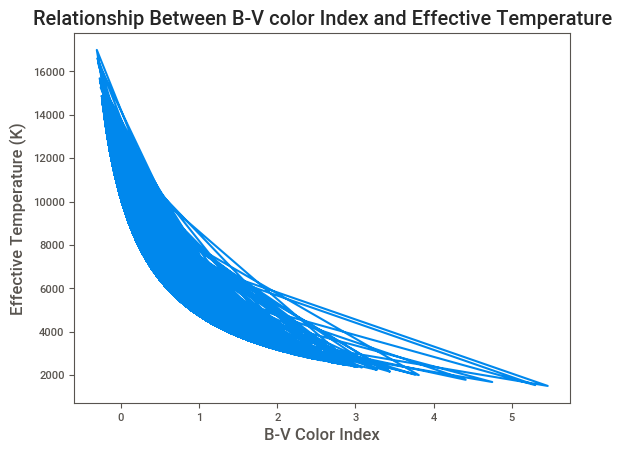

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# df = pd.DataFrame({'B-V': np.random.uniform(0.0, 2.0, len(df))})
df["Temp/Teff (K)"] = 4600 * ((1 / (0.92 * df['B-V'] + 1.7)) + (1 / (0.92 * df['B-V'] + 0.62)))

# Kelvin to Celsius
# df['Temp'] = df['Temp'] - 273.15
# df.head(5)

plt.plot(df['B-V'], df['Temp/Teff (K)'])
plt.xlabel('B-V Color Index')
plt.ylabel('Effective Temperature (K)')
plt.title('Relationship Between B-V color Index and Effective Temperature')
plt.show()

**Checking Ballesteros BV->Temperature Conversation:** For stars between 0.0 and 2.0 magnitudes with B-V colors, the formula is accurate to about 1%. For stars with effective temperatures between 4000 and 10000 Kelvin, it is also accurate to within about 1%.

<table style="text-align:center; border: 0.5px solid black; padding: 5px;">
    <p style="text-align:center;"><b>Sample Calibration Colors</b></p>
  <thead>
    <tr>
      <th>Class</th>
      <th>B−V</th>
      <th>U−B</th>
      <th>V−R</th>
      <th>R−I</th>
      <th><i>T</i><sub>eff</sub> (K)</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td>O5V</td>
      <td>−0.33</td>
      <td>−1.19</td>
      <td>−0.15</td>
      <td>−0.32</td>
      <td>42,000</td>
    </tr>
    <tr>
      <td>B0V</td>
      <td>−0.30</td>
      <td>−1.08</td>
      <td>−0.13</td>
      <td>−0.29</td>
      <td>30,000</td>
    </tr>
    <tr>
      <td>A0V</td>
      <td>−0.02</td>
      <td>−0.02</td>
      <td>0.02</td>
      <td>−0.02</td>
      <td>9,790</td>
    </tr>
    <tr>
      <td>F0V</td>
      <td>0.30</td>
      <td>0.03</td>
      <td>0.30</td>
      <td>0.17</td>
      <td>7,300</td>
    </tr>
    <tr>
      <td>G0V</td>
      <td>0.58</td>
      <td>0.06</td>
      <td>0.50</td>
      <td>0.31</td>
      <td>5,940</td>
    </tr>
    <tr>
      <td>K0V</td>
      <td>0.81</td>
      <td>0.45</td>
      <td>0.64</td>
      <td>0.42</td>
      <td>5,150</td>
    </tr>
    <tr>
      <td>M0V</td>
      <td>1.40</td>
      <td>1.22</td>
      <td>1.28</td>
      <td>0.91</td>
      <td>3,840</td>
    </tr>
  </tbody>
  <tfoot></tfoot>
</table>


> *The formula can be used to change the effective temperature into either B-V color or the other way around and it is a semi-empirical formula that was developed by Jordi Ballesteros in 2009.
(**Source:** [Wikipedia](https://en.wikipedia.org/wiki/Color_index))*

## Absolute Magnitude Calculations

**Visual Apparent Magnitude to Absolute Magnitude:** Because it is based on the inverse-square law of light, the formula for determining a star's luminosity from its visual apparent magnitude or absolute magnitude is the same for both. According to the inverse-square law of light, light intensity diminishes with a square of the distance from the source.

The inverse-square law of light can be used to determine the absolute magnitude of a star if its distance from earth and its visual apparent magnitude are known. Here, we used steller parallax values.

In [ ]:
# Find Absolute Magnitude

import numpy as np

# Drop 'Plx' Values with Zero or Negative Values
df = df[df['Plx'] > 0].copy()

# Set Parallax as Arcseconds
df['Plx_Arcseconds'] = df['Plx']

df.drop(columns=['Plx'], inplace=True)

# Check if 'Amag' column exists in the DataFrame
if 'Amag' not in df.columns:
      df['Amag'] = df['Vmag'] - 5 * np.log10(df['Plx_Arcseconds']) + 5

## Calculated Luminosity of Stars

**Luminosity:** The total amount of energy emitted by a star every second is known as its luminosity. Watts or solar luminosities are used to measure it. 1 solar luminosity, or (3.828e+26) watts, is the brightness of the Sun.

Relationship between Absolute Magnitude and Luminosity can be shown as:

<div style="text-align:center;">
    <p style="text-align:center;"><b>Absolute Magnitude and Luminosity Relation</b></p>
    <img style="text-align:center; border: 0.5px solid black; padding: 5px;" src="https://image1.slideserve.com/2745024/absolute-magnitude-and-luminosity-l.jpg" width="400">
</div>

> *The absolute magnitude of a star is a measure of its brightness as seen from a distance of 10 parsecs. It is calculated by measuring the apparent magnitude of the star and then correcting for the distance to the star. The luminosity can be calculated from its absolute magnitude.
(**Source:** [SlideServe](https://www.slideserve.com/mahsa/stars))*

A black hole is a region of spacetime where gravity is so intense that no light can escape from it. Black holes have luminosities that are less than five times that of the sun.

Consequently, by comparing a star's luminosity to this cutoff point, it is possible to determine whether or not a star is a black hole. The formula to find stars luminosity:

<div style="text-align:center;">
<em>L</em><sub></sub> / <em>L</em><sub>sun</sub> =
10<sup>0.4(4.85 -           
<em>M</em>)</sup>
</center>
</div>

In [ ]:
import numpy as np

sun_luminosity = 3.828e26

def calculate_luminosity(absolute_magnitude):

  return sun_luminosity * 10**(0.4 * (4.83 - absolute_magnitude))

absolute_magnitude = df['Amag']
df['Luminosity'] = calculate_luminosity(absolute_magnitude)

# Drop Values If >= 10^-6 (Optional)
# df = df[df['Luminosity'] >= 1e-6]

df.head(len(df))

,Vmag,e_Plx,B-V,SpType,Temp/Teff (K),Plx_Arcseconds,Amag,Luminosity
2,6.61,0.63,-0.019,B9,10368.595703,2.81,9.366468,5.866573e+24
3,8.06,0.97,0.370,F0V,7044.130371,7.75,8.613492,1.173749e+25
4,8.55,1.11,0.902,G8III,4991.060547,2.87,11.260591,1.025028e+24
8,8.59,0.99,1.067,G5,4587.424316,4.81,10.179275,2.774994e+24
9,8.59,1.10,0.489,F6V,6439.202148,10.76,8.430939,1.388661e+25
...,...,...,...,...,...,...,...,...
99992,7.69,0.92,1.110,K2III,4493.257812,6.60,8.592280,1.196905e+25
99993,7.92,1.24,0.133,Am...,8720.653320,3.93,9.948037,3.433657e+24
99994,8.72,0.87,0.097,B3,9056.739258,3.07,11.284308,1.002879e+24
99996,8.08,0.68,1.094,G5,4527.817871,1.07,12.933081,2.196542e+23


## Hertzsprung-Russell Diagram

**Hertzsprung-Russell Diagram:** The luminosity (brightness) of stars is graphed against their surface temperature (color), and this relationship is known as the Hertzsprung-Russell (H-R) diagram. It is one of the most crucial tools in astronomy because it can be used to understand the characteristics and course of star evolution.

By observing the location of the stars on the H-R diagram, giant and dwarf stars can be distinguished. Dwarf stars are brighter and hotter than giant stars, which are typically very bright and cool. This is due to the fact that giant stars are able to emit more energy because they have a much larger surface area than dwarf stars.

The behavior of nearby stars can be used to infer the presence of black holes, even though they cannot be directly seen on the H-R diagram.

<div style="text-align:center;">
    <img style="text-align:center; border: 0.5px solid black; padding: 5px;" src="//upload.wikimedia.org/wikipedia/commons/thumb/6/6b/HRDiagram.png/310px-HRDiagram.png" alt="Black Hole Lensing" width="350">
</div>

> *An observational Hertzsprung–Russell diagram with 22,000 stars plotted from the <a href="/wiki/Hipparcos_Catalogue" class="mw-redirect" title="Hipparcos Catalogue">Hipparcos Catalogue</a> and 1,000 from the <a href="/wiki/Gliese_Catalogue" class="mw-redirect" title="Gliese Catalogue">Gliese Catalogue</a> of nearby stars. Stars tend to fall only into certain regions of the diagram. The most prominent is the diagonal, going from the upper-left (hot and bright) to the lower-right (cooler and less bright), called the <a href="/wiki/Main_sequence" title="Main sequence">main sequence</a>. In the lower-left is where <a href="/wiki/White_dwarf" title="White dwarf">white dwarfs</a> are found, and above the main sequence are the <a href="/wiki/Subgiant" title="Subgiant">subgiants</a>, <a href="/wiki/Giant_stars" class="mw-redirect" title="Giant stars">giants</a> and <a href="/wiki/Supergiant" title="Supergiant">supergiants</a>. The <a href="/wiki/Sun" title="Sun">Sun</a> is found on the main sequence at luminosity 1 (<a href="/wiki/Absolute_magnitude" title="Absolute magnitude">absolute magnitude</a> 4.8) and B−V <a href="/wiki/Color_index" title="Color index">color index</a> 0.66 (temperature 5780 K, <a href="/wiki/Spectral_type" class="mw-redirect" title="Spectral type">spectral type</a> G2V).
(**Source:** [Wikipedia](https://en.wikipedia.org/wiki/Hertzsprung%E2%80%93Russell_diagram))*

In [ ]:
import plotly.express as px

fig = px.scatter_3d(df, y="Amag", x="Temp/Teff (K)", z="Amag", color="SpType",
                     log_x=True, log_y=True, title='Hertzsprung-Russell Diagram (3D)',
                     template='plotly_dark',
                     labels={'Temp/Teff (K)': 'Surface Temperature (K)', 'SpType': 'Spectral Type', 'Amag': 'Absolute Magnitude'})
fig.show()

## Mass and Radius of Stars


**Stellar radius formula derived from the Stefan-Boltzmann law:** By contrasting the luminosity and temperature of stars, the Stefan-Boltzmann law can be used to determine the radius of the stars. According to the Stefan-Boltzmann law, a blackbody's total power radiated per unit surface area is inversely proportional to its temperature. This means that hotter stars radiate more energy than cooler stars do, and that the amount of surface area that a star can radiate from depends on its radius.

In [ ]:
# Radius using Stefan-Boltzmann Law

import numpy as np

stefan_boltzmann_constant = 5.670374419 * 10**(-8)  # Stefan-Boltzmann constant (Wm^-2 K^-4)

# Assuming 'Temp/Teff (K)' column contains temperature in Kelvin
df['Radius'] = np.sqrt(df['Luminosity'] / (4 * np.pi * stefan_boltzmann_constant * (df['Temp/Teff (K)']**4)))

# df['Radius'] = np.sqrt(df['Luminosity'] / (4 * np.pi * (df['Temp/Teff (K)'] ** 4)))

# df = df[df['Radius'] > 0]

**Steller Mass-Luminosity Relation:** The relationship between a star's mass and luminosity is described by the mass-luminosity relation, a physical law. According to the mass-luminosity relation, a star's luminosity is inversely proportional to its mass. *(**Source:** [Wikipedia](https://en.wikipedia.org/wiki/Mass%E2%80%93luminosity_relation))*

<div style="text-align:center;">
    <p style="text-align:center;"><b>Approximate Mass-Luminosity Relation</b></p>
    <img style="text-align:center; border: 0.5px solid black; padding: 5px;" src="https://www.astronomy.ohio-state.edu/thompson.1847/1144/MLrel_eqn.gif" height="100">
</div>

In [ ]:
# Approximate Mass of star

sun_mass = 1.989e30
sun_luminosity = 3.828e26

df['Approximate Mass'] = sun_mass * (df['Luminosity'] / sun_luminosity) ** (1/3.5)

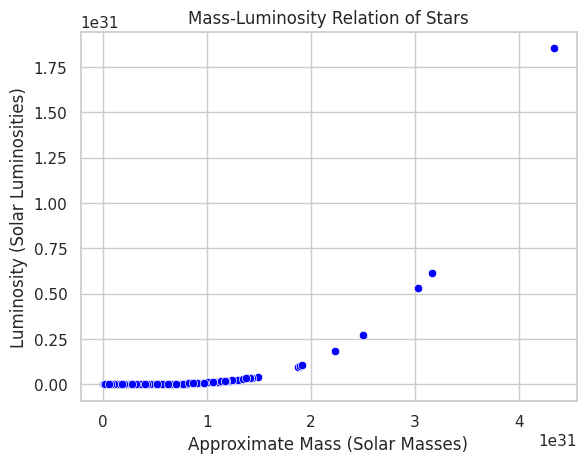

In [ ]:
# Approximate Mass vs. Luminosity Graph
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style of the plot (optional)
sns.set(style="whitegrid")

# Plot the data using Seaborn
sns.scatterplot(data=df, x='Approximate Mass', y='Luminosity', color='blue', marker='o')

# Add labels and title
plt.xlabel('Approximate Mass (Solar Masses)')
plt.ylabel('Luminosity (Solar Luminosities)')
plt.title('Mass-Luminosity Relation of Stars')

# Show the plot
plt.show()

In [ ]:
# Debug Purpose
df

,Vmag,e_Plx,B-V,SpType,Temp/Teff (K),Plx_Arcseconds,Amag,Luminosity,Radius,Approximate Mass
2,6.61,0.63,-0.019,B9,10368.595703,2.81,9.366468,5.866573e+24,26689568.0,6.028111e+29
3,8.06,0.97,0.370,F0V,7044.130371,7.75,8.613492,1.173749e+25,81794096.0,7.349125e+29
4,8.55,1.11,0.902,G8III,4991.060547,2.87,11.260591,1.025028e+24,48147232.0,3.661930e+29
8,8.59,0.99,1.067,G5,4587.424316,4.81,10.179275,2.774994e+24,93773984.0,4.867311e+29
9,8.59,1.10,0.489,F6V,6439.202148,10.76,8.430939,1.388661e+25,106469024.0,7.710790e+29
...,...,...,...,...,...,...,...,...,...,...
99992,7.69,0.92,1.110,K2III,4493.257812,6.60,8.592280,1.196905e+25,203000144.0,7.390263e+29
99993,7.92,1.24,0.133,Am...,8720.653320,3.93,9.948037,3.433657e+24,28864870.0,5.172687e+29
99994,8.72,0.87,0.097,B3,9056.739258,3.07,11.284308,1.002879e+24,14463377.0,3.639146e+29
99996,8.08,0.68,1.094,G5,4527.817871,1.07,12.933081,2.196542e+23,27082022.0,2.358133e+29


## Spectral Type Classifications

Based on factors like temperature and other attributes, stars are categorized into spectral types. Different classes are denoted by letters in the spectral classification system (O, B, A, F, G, K, M), and occasionally these classes are further divided by numbers (e.g., O2, B3, A7).

<div style="text-align:center;">
    <img style="text-align:center; border: 0.5px solid black; padding: 5px;" src="https://www.astronomytrek.com/wp-content/uploads/2017/10/Star-Classification-Chart.jpg" alt="Black Hole Lensing" width="500">
</div>

> *In astronomy, stellar classification is the classification of stars based on their spectral characteristics. A simple chart for classifying the main star types using Harvard classification.
(**Source:** [AstronomyTrek](https://www.astronomytrek.com/list-of-different-star-types/))*

In [ ]:
import pandas as pd

# Create a function to extract the root character
def extract_root_sptype(sptype):
    if pd.notna(sptype) and sptype[0] in ['O', 'B', 'A', 'F', 'G', 'K', 'M']:
        return sptype[0]
    else:
        return None

# Apply the function to the 'SpType' column and store the result in the 'Root SpType' column
df['Root SpType'] = df['SpType'].apply(extract_root_sptype)


In [ ]:
import plotly.express as px
import pandas as pd

fig = px.scatter(df,
                 x="Temp/Teff (K)",
                 y="Amag",
                 size="Radius",
                 color="Root SpType",
                 size_max=60,
                 template="plotly_dark",
                 title="Temp/Teff (K) vs Absolute Magnitude")

# Set the y-axis range to limit the luminosity values up to 10^30
fig.update_layout(
    xaxis_title="Temp/Teff (K)",
    yaxis_title="Absolute Magnitude",
    legend_title="Spectral Type",
    showlegend=True
)

fig.show()

**Pie Chart:** Pie Chart categorization is provided below:

In [ ]:
import plotly.express as px
import pandas as pd

# Assuming 'df' is your DataFrame with 'Root SpType' column

# Calculate the count of unique 'Root SpType' values
d = df['Root SpType'].value_counts().reset_index()
d.columns = ['Root SpType', 'Count']

# Define colors or use built-in Plotly colors
colors = px.colors.qualitative.Set3

fig = px.pie(d, values='Count', names='Root SpType', hole=0.4,
             color_discrete_sequence=colors,
             labels={'Root SpType': 'Star Type', 'Count': 'No. Of Samples'})

# fig.add_annotation(text='Need to resample the data<br> to get a balanced dataset',
#                    x=1.2, y=0.9, showarrow=False, font_size=12, opacity=0.7, font_family='arial')

fig.add_annotation(text='Classified Stars',
                   x=0.5, y=0.5, showarrow=False, font_size=12, opacity=0.7, font_family='arial')

fig.update_layout(
    font_family='arial',
    title=dict(text='Star Types', x=0.47, y=0.98, font=dict(color=colors[2], size=20)),
    legend=dict(x=0.37, y=-0.50, orientation='h', traceorder='reversed'),
    hoverlabel=dict(bgcolor='white'))

fig.update_traces(textposition='outside', textinfo='percent+label')

fig.show()

## Potential Black Hole Observations

In [ ]:
# Considering values are zero

df['Black Hole'] = 0

## Hot Stars

**Hot Stars:** The stars with the highest probability of turning into black holes are O-type stars, B-type stars, then A-type stars, and so on. The stars that are least likely to become black holes are M-type stars.

This is due to the fact that M-type stars are the least massive and coolest stars, whereas O-type stars have the highest mass and temperature. A star's gravitational pull is stronger and its likelihood of collapsing into a black hole increases with mass. So only need Hot stars because we want to predict black holes between these stars in the dataset. Here, the value will be set to "True" if the star is a hot star and "False" otherwise.

In [ ]:
df['Hot Star'] = df['Root SpType'].apply(lambda x: 1 if x in ['O', 'B'] else 0)

# df = df[df['Hot Star'] == 'True']

# df.loc[(df['Hot Star'] == 1), 'Black Hole'] = 1

In [ ]:
# Debug Purpose
df

,Vmag,e_Plx,B-V,SpType,Temp/Teff (K),Plx_Arcseconds,Amag,Luminosity,Radius,Approximate Mass,Root SpType,Black Hole,Hot Star
2,6.61,0.63,-0.019,B9,10368.595703,2.81,9.366468,5.866573e+24,26689568.0,6.028111e+29,B,0,1
3,8.06,0.97,0.370,F0V,7044.130371,7.75,8.613492,1.173749e+25,81794096.0,7.349125e+29,F,0,0
4,8.55,1.11,0.902,G8III,4991.060547,2.87,11.260591,1.025028e+24,48147232.0,3.661930e+29,G,0,0
8,8.59,0.99,1.067,G5,4587.424316,4.81,10.179275,2.774994e+24,93773984.0,4.867311e+29,G,0,0
9,8.59,1.10,0.489,F6V,6439.202148,10.76,8.430939,1.388661e+25,106469024.0,7.710790e+29,F,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
99992,7.69,0.92,1.110,K2III,4493.257812,6.60,8.592280,1.196905e+25,203000144.0,7.390263e+29,K,0,0
99993,7.92,1.24,0.133,Am...,8720.653320,3.93,9.948037,3.433657e+24,28864870.0,5.172687e+29,A,0,0
99994,8.72,0.87,0.097,B3,9056.739258,3.07,11.284308,1.002879e+24,14463377.0,3.639146e+29,B,0,1
99996,8.08,0.68,1.094,G5,4527.817871,1.07,12.933081,2.196542e+23,27082022.0,2.358133e+29,G,0,0


## Giant or Dwarf Stars

**Giant Stars:** Because giant stars have a shorter lifespan than dwarf stars, they are also more likely to collapse into black holes. This is due to the fact that giant stars deplete their fuel faster than dwarf stars. A giant star can collapse into a white dwarf, neutron star, or black hole when its fuel runs out. The likelihood of a giant star collapsing into a black hole increases with its mass.

In [ ]:
def replace_sp_type(sp_type):
    if sp_type.endswith(('I', 'II', 'III')):
        return 1
    elif sp_type.endswith(('IV', 'V', 'VI')):
        return 0
    else:
        return -1

df = df.dropna(subset=['SpType'])

# Drop columns where SpType ends with 'VII'
df = df[~df['SpType'].str.endswith('VII')]

df['Giant or Dwarf'] = [replace_sp_type(sp_type) for sp_type in df['SpType']]

# df.loc[(df['Giant or Dwarf'] == 1), 'Black Hole'] = 1

# df

In [ ]:
def set_black_hole(row):
    if row['Giant or Dwarf'] == 1 or row['Hot Star'] == 1:
        return 1
    else:
        return 0

# Apply the function to each row and assign the result to the 'Black Hole' column
df['Black Hole'] = df.apply(set_black_hole, axis=1)

In [ ]:
df

,Vmag,e_Plx,B-V,SpType,Temp/Teff (K),Plx_Arcseconds,Amag,Luminosity,Radius,Approximate Mass,Root SpType,Black Hole,Hot Star,Giant or Dwarf
2,6.61,0.63,-0.019,B9,10368.595703,2.81,9.366468,5.866573e+24,26689568.0,6.028111e+29,B,1,1,-1
3,8.06,0.97,0.370,F0V,7044.130371,7.75,8.613492,1.173749e+25,81794096.0,7.349125e+29,F,0,0,0
4,8.55,1.11,0.902,G8III,4991.060547,2.87,11.260591,1.025028e+24,48147232.0,3.661930e+29,G,1,0,1
8,8.59,0.99,1.067,G5,4587.424316,4.81,10.179275,2.774994e+24,93773984.0,4.867311e+29,G,0,0,-1
9,8.59,1.10,0.489,F6V,6439.202148,10.76,8.430939,1.388661e+25,106469024.0,7.710790e+29,F,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99992,7.69,0.92,1.110,K2III,4493.257812,6.60,8.592280,1.196905e+25,203000144.0,7.390263e+29,K,1,0,1
99993,7.92,1.24,0.133,Am...,8720.653320,3.93,9.948037,3.433657e+24,28864870.0,5.172687e+29,A,0,0,-1
99994,8.72,0.87,0.097,B3,9056.739258,3.07,11.284308,1.002879e+24,14463377.0,3.639146e+29,B,1,1,-1
99996,8.08,0.68,1.094,G5,4527.817871,1.07,12.933081,2.196542e+23,27082022.0,2.358133e+29,G,0,0,-1


**Note:** Based on the Roman numeral convention, stars labeled with Roman numerals greater than or equal to 'III' are classified as giants. Those labeled with Roman numerals less than 'III' are classified as dwarfs. Information collected from Dataset.

## Extreme Mass

<div style="text-align:center;">
<!--     <p style="text-align:center;"><b>Minimum Mass for Potential Black Hole</b></p> -->
    <img style="text-align:center; border: 0.5px solid black; padding: 5px;" src="https://scx1.b-cdn.net/csz/news/800a/2021/establishing.jpg" height="100">
</div>

**Extreme Mass:** The minimum stellar mass with a clear possibility of becoming a black hole is around 3 solar masses. *(**Source:** [Wikipedia](https://en.wikipedia.org/wiki/Supermassive_black_hole))*

* **TOV Limit:** As mentioned earlier, the Tolman–Oppenheimer–Volkoff (TOV) limit, around 3 solar masses, marks the theoretical threshold for black hole formation.
* **Mass Uncertainty:** Stellar evolution models incorporate factors like rotation, metallicity, and binary interactions, introducing some uncertainty.
* **Minimum for Black Hole:** Based on current models, stars with at least 5 solar masses have a high probability of collapsing into black holes after supernovae.

In [ ]:
sun_mass = 1.989e30

# df.loc[(df['Approximate Mass'] > 3 * sun_mass), 'Black Hole'] = 1 # As Tolman–Oppenheimer–Volkoff (TOV) limit

# print(df)

In [ ]:
# Define sun_mass
sun_mass = 1.989e30  # for example

# Define a function to apply the condition row-wise
def set_black_hole(row):
    if (row['Giant or Dwarf'] == 1 or row['Hot Star'] == 1) and row['Approximate Mass'] > 3 * sun_mass:
        return 1
    else:
        return 0

# Apply the function to each row and assign the result to the 'Black Hole' column
df['Black Hole'] = df.apply(set_black_hole, axis=1)

In [ ]:
df.head()

,Vmag,e_Plx,B-V,SpType,Temp/Teff (K),Plx_Arcseconds,Amag,Luminosity,Radius,Approximate Mass,Root SpType,Black Hole,Hot Star,Giant or Dwarf
2,6.61,0.63,-0.019,B9,10368.595703,2.81,9.366468,5.866573e+24,26689568.0,6.028111e+29,B,0,1,-1
3,8.06,0.97,0.370,F0V,7044.130371,7.75,8.613492,1.173749e+25,81794096.0,7.349125e+29,F,0,0,0
4,8.55,1.11,0.902,G8III,4991.060547,2.87,11.260591,1.025028e+24,48147232.0,3.661930e+29,G,0,0,1
8,8.59,0.99,1.067,G5,4587.424316,4.81,10.179275,2.774994e+24,93773984.0,4.867311e+29,G,0,0,-1
9,8.59,1.10,0.489,F6V,6439.202148,10.76,8.430939,1.388661e+25,106469024.0,7.710790e+29,F,0,0,0


In [ ]:
import plotly.express as px

# Creating the 2D scatter plot using Plotly Express
fig = px.scatter(df, x='Approximate Mass', y='B-V', color='Temp/Teff (K)',
                 size='Approximate Mass', opacity=0.7, size_max=20, template='plotly_white',
                 title='Potential Black Holes')

# Set labels and other properties
fig.update_layout(xaxis_title='Approximate Mass', yaxis_title='B-V')

fig.show()


## K-Nearest Neighbour

In [ ]:
from sklearn.neighbors import NearestNeighbors

# Filter dataframe to include only rows where 'Black Hole' is 1
black_hole_df = df[df['Black Hole'] == 1]

# Define feature and target variables
X = black_hole_df[['Approximate Mass']]
y = []

# Assign labels to each category based on mass thresholds
for mass in black_hole_df['Approximate Mass']:
    if mass <= 3 * 1.989e30:
        y.append('Stellar Mass Black Hole')
    elif mass <= 100 * 1.989e30:
        y.append('Intermediate Mass Black Hole')
    else:
        y.append('Supermassive Black Hole')

# Train the KNN model
k = 5  # Number of neighbors to consider
knn_model = NearestNeighbors(n_neighbors=k, algorithm='auto')
knn_model.fit(X)

# Define thresholds for each category
thresholds = [3 * 1.989e30, 100 * 1.989e30, 1e5 * 1.989e30]

# Find nearest neighbors for each category
for i, threshold in enumerate(thresholds):
    # Find indices of nearest neighbors for the current category
    indices = knn_model.kneighbors([[threshold]])[1][0]

    # Print nearest neighbors for the current category
    print(f"Nearest neighbors for category: {y[i]}")
    print(black_hole_df.iloc[indices])
    print()

Nearest neighbors for category: Intermediate Mass Black Hole
       Vmag  e_Plx    B-V SpType  Temp/Teff (K)  Plx_Arcseconds      Amag  \
59024  4.14   0.51  0.353  F2III    7140.835449       50.790001  0.611108   
87755  2.24   0.46  1.521  K5III    3762.191162       22.100000  0.518039   
94290  3.07   0.46  0.990  G9III    4766.876465       32.540001  0.507912   
65417  0.98   0.86 -0.235    B1V   14491.924805       12.440000  0.505898   
40669  4.05   0.49  0.413  F5III    6811.765137       51.400002  0.495185   

         Luminosity        Radius  Approximate Mass Root SpType  Black Hole  \
59024  1.864355e+28  3.172163e+09      6.036620e+30           F           1   
87755  2.031218e+28  1.192850e+10      6.186292e+30           K           1   
94290  2.050252e+28  7.464918e+09      6.202800e+30           G           1   
65417  2.054058e+28  8.084319e+08      6.206088e+30           B           1   
40669  2.074426e+28  3.677213e+09      6.223608e+30           F           1   

 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but NearestNeighbors was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but NearestNeighbors was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but NearestNeighbors was fitted with feature names



## Exploratory Data Analysis (EDA) and Preprocessing

In [ ]:
# Main data before preprocessing

df.to_csv('/kaggle/working/raw_data.csv', index=False)

In [ ]:
from sklearn.preprocessing import RobustScaler

# Select only the attributes to scale
attributes_to_scale = ['Vmag', 'Plx_Arcseconds', 'e_Plx', 'B-V', 'Temp/Teff (K)', 'Amag', 'Luminosity', 'Radius', 'Approximate Mass']
df_to_scale = df[attributes_to_scale]

# Initialize MinMaxScaler
scaler = RobustScaler()

# Fit and transform the selected data
scaled_data = scaler.fit_transform(df_to_scale)

# Replace the original data with the scaled data
df[attributes_to_scale] = scaled_data


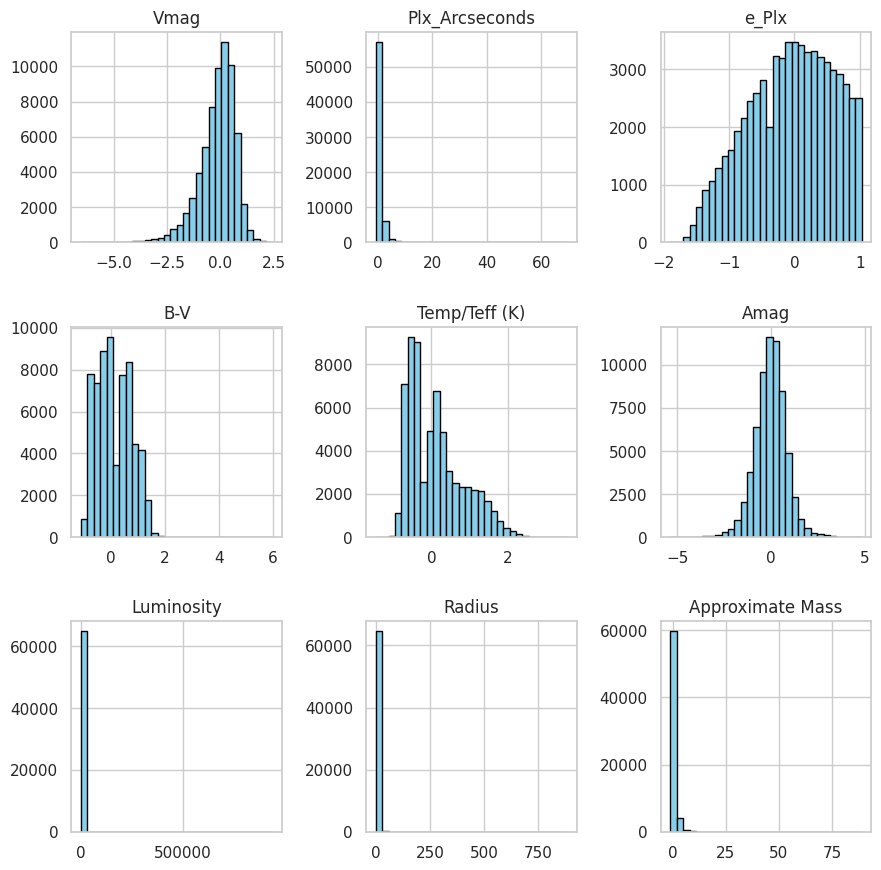

In [ ]:
selected_columns = ['Vmag', 'Plx_Arcseconds', 'e_Plx', 'B-V', 'Temp/Teff (K)', 'Amag', 'Luminosity', 'Radius', 'Approximate Mass']
# Create the histograms using df.hist
df.hist(column=selected_columns, figsize=(10,10), bins=30, color='skyblue', edgecolor='black')
# Adjust space between subplots (adjust values as needed)
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.4)

In [ ]:
# Count non-null values in each column
column_data_counts = df.count()

# Print column names and data counts to check class imbalanced data
print("Number of data in each column:")
for col, count in column_data_counts.items():
    print(f"  - {col}: {count}")

Number of data in each column:
  - Vmag: 64789
  - e_Plx: 64789
  - B-V: 64789
  - SpType: 64789
  - Temp/Teff (K): 64789
  - Plx_Arcseconds: 64789
  - Amag: 64789
  - Luminosity: 64789
  - Radius: 64789
  - Approximate Mass: 64789
  - Root SpType: 64663
  - Black Hole: 64789
  - Hot Star: 64789
  - Giant or Dwarf: 64789


## Potential Black Holes

In [ ]:
# Rows with Possible Potential Black Holes
num_of_rows = df[(df['Black Hole'] == 1)]

print("Number of rows:", num_of_rows.shape[0])
print("Number of columns:", num_of_rows.shape[1])

Number of rows: 26
Number of columns: 14


In [ ]:
num_of_rows

,Vmag,e_Plx,B-V,SpType,Temp/Teff (K),Plx_Arcseconds,Amag,Luminosity,Radius,Approximate Mass,Root SpType,Black Hole,Hot Star,Giant or Dwarf
676,-4.500001,-0.733333,-0.773006,B9p,1.493837,5.181003,-3.304122,2787.894043,18.661314,15.932290,B,1,1,-1
3417,-4.522728,-0.433333,0.523926,K0III,-0.420240,5.259857,-3.323132,2941.564941,100.688690,16.196815,K,1,0,1
7582,-5.727274,-1.266667,-0.920245,B3Vp,2.147714,3.224014,-3.554267,5648.109375,18.740639,19.759619,B,1,1,-1
9875,-4.545455,0.133333,0.685890,K2III,-0.514010,8.026881,-3.597974,6389.666992,169.011322,20.511240,K,1,0,1
14563,-4.484849,-0.166667,-0.730061,B8V,1.344467,5.456989,-3.329352,2993.666748,21.219868,16.284260,B,1,1,0
21402,-5.409092,0.000000,1.160736,K5III,-0.730332,8.136201,-3.978683,18712.525391,403.064117,28.310207,K,1,0,1
25409,-4.818183,-0.233333,-0.885890,B7III,1.971045,3.620071,-3.228551,2252.360352,12.738291,14.919875,B,1,1,1
27607,-3.704547,-1.266667,0.679755,K1.5III,-0.510680,5.958781,-3.047551,1351.296753,77.032898,12.731750,K,1,0,1
40669,-3.000001,-1.533333,-0.219632,F5III,0.262425,8.370968,-2.959221,1053.075806,28.213533,11.774445,F,1,0,1
49631,-5.037880,-0.533333,-0.833129,B7V,1.730623,6.702509,-3.695467,8413.583984,28.687096,22.286375,B,1,1,0


# **Model Training/Evaluation**

## **Fundamentals of Black Hole Classification**
Numerous characteristics, such as black holes' mass, charge, and spin (angular momentum), can be used to categorize them. The following elements contribute to the definition of black hole traits and attributes:

* **Mass:** One of the key identifying characteristics of a black hole is its mass. Based on their mass, black holes are typically divided into three primary groups:

    1. **Stellar-Mass Black Holes:** These have masses ranging from a few to around 100 times that of the Sun and are created by the gravitational collapse of huge stars.

    2. **Intermediate-Mass Black Holes:** These have masses that fall in the range of stellar-mass black holes and supermassive black holes, and are hundreds to thousands of times as big as the Sun.
    3. **Supermassive Black Holes:** These can have masses of millions to billions of solar masses, are discovered at the galactic centers.

* **Charge:** Black holes are capable of carrying an electric charge, in theory. Black holes that are "charged" or "Reissner-Nordström" in nature are referred to as such. However, black holes are frequently regarded as neutral (uncharged) in astrophysical circumstances.

* **Spin(Angular Momentum):** Black holes can also have spin, sometimes known as angular momentum. The Kerr metric can be used to characterize a rotating black hole. The amount of spin has an impact on a number of black hole characteristics, including the event horizon's structure and the behavior of particles and light in its vicinity.

* **Formation Mechanism:** Black holes can be categorized according to their formation mechanism:

    1. **Stellar Collapse:** Stellar-mass black holes are created when huge stars run out of nuclear fuel and gravitationally collapse, creating a black hole in the process.

    2. **Accretion and Mergers:** Over cosmic timescales, it is hypothesized that supermassive black holes are created through the slow accretion of gas and the merging of smaller black holes.
     
* **Rotational Symmetry:** Black holes can be categorized according to their rotational symmetry using the following criteria:

    1. **Schwarzschild Black Holes:** The Schwarzschild metric describes non-rotating black holes.

    2. **Kerr Black Holes:** The Kerr metric can be used to define rotating black holes.

    3. **Kerr-Newman Black Holes:** The Kerr-Newman metric can be used to describe rotating and charged black holes.

* **Observable Features:** Black holes can also be categorized according on their observable characteristics, such as their gravity wave emissions, X-ray emissions, and gamma-ray emissions, as well as the presence of accretion disks and jets.

Black holes are classified and their characteristics and behaviors are understood by scientists and thanks to a combination of these features. It's crucial to remember that our knowledge about black holes is constantly changing, and as new observations and hypotheses are discovered, our classifications may be adjusted or refined.

## SMOTE (Synthetic Minority Over-sampling Technique)

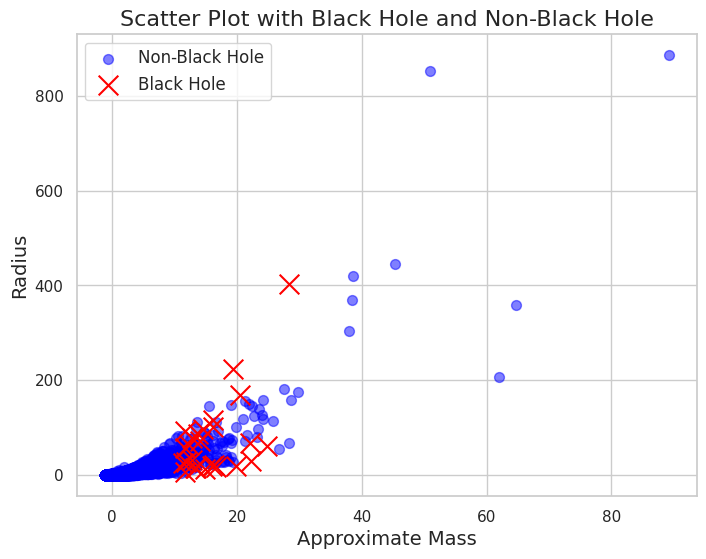

In [ ]:
import matplotlib.pyplot as plt

# Separate the data based on the 'Black Hole' column
black_hole_df = df[df['Black Hole'] == 1]
non_black_hole_df = df[df['Black Hole'] == 0]

# Plot the scatter plot
plt.figure(figsize=(8, 6))  # Adjust figure size

# Plot non-black hole data points with faded blue 'o'
plt.scatter(non_black_hole_df['Approximate Mass'], non_black_hole_df['Radius'], color='blue', marker='o', label='Non-Black Hole', s=50, alpha=0.5)

# Plot black hole data points with red 'X'
plt.scatter(black_hole_df['Approximate Mass'], black_hole_df['Radius'], color='red', marker='x', label='Black Hole', s=200)

# Add labels and legend with larger font size
plt.xlabel('Approximate Mass', fontsize=14)  # Adjust font size
plt.ylabel('Radius', fontsize=14)  # Adjust font size
plt.title('Scatter Plot with Black Hole and Non-Black Hole', fontsize=16)  # Adjust font size
plt.legend(fontsize=12)  # Adjust font size

# Show plot
plt.show()

**SMOTE (Synthetic Minority Over-sampling Technique):** Creates synthetic samples for the minority class based on existing data. It's more sophisticated than basic oversampling and can be highly effective.

As there are severe class imbalance because of lower number of potential black holes within stars, as we can see from the output so we need to apply oversampling on minority class.

## Logistic Regression

In [ ]:
print(df['Black Hole'].unique())

[0 1]


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, precision_score, recall_score, f1_score
from imblearn.over_sampling import SMOTE
from sklearn.metrics import accuracy_score

# Define feature and target variables
X = df[['Vmag', 'Plx_Arcseconds', 'Plx_Arcseconds','B-V', 'Temp/Teff (K)', 'Amag', 'Luminosity', 'Radius', 'Approximate Mass']]
y = df['Black Hole']

### SMOTE for Logistic Regression

In [ ]:
# Apply SMOTE with customized parameters to balance the dataset
smote = SMOTE(sampling_strategy=0.5, k_neighbors=5, random_state=45)
X_resampled, y_resampled = smote.fit_resample(X, y)

In [ ]:
# Split the resampled data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=45)

# Initialize Logistic Regression model with L2 regularization
logistic_reg = LogisticRegression(penalty='l2', solver='liblinear', max_iter=1000)

# Train the model
logistic_reg.fit(X_train, y_train)

# Make predictions
y_pred = logistic_reg.predict(X_test)

# Evaluation
accuracy = accuracy_score(y_test, y_pred) * 100
precision = precision_score(y_test, y_pred) * 100
recall = recall_score(y_test, y_pred) * 100
f1 = f1_score(y_test, y_pred) * 100
conf_matrix = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

# Print evaluation metrics
print("Evaluation metrics for Logistic Regression:")
print(f"Accuracy: {accuracy:.2f}%")
print(f"Precision: {precision:.2f}%")
print(f"Recall: {recall:.2f}%")
print(f"F1-score: {f1:.2f}%")
print("Confusion Matrix:")
print(conf_matrix)
print("Classification Report:")
print(classification_rep)

Evaluation metrics for Logistic Regression:
Accuracy: 99.75%
Precision: 99.24%
Recall: 100.00%
F1-score: 99.62%
Confusion Matrix:
[[12995    49]
 [    0  6385]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     13044
           1       0.99      1.00      1.00      6385

    accuracy                           1.00     19429
   macro avg       1.00      1.00      1.00     19429
weighted avg       1.00      1.00      1.00     19429



## Correlation Heatmap

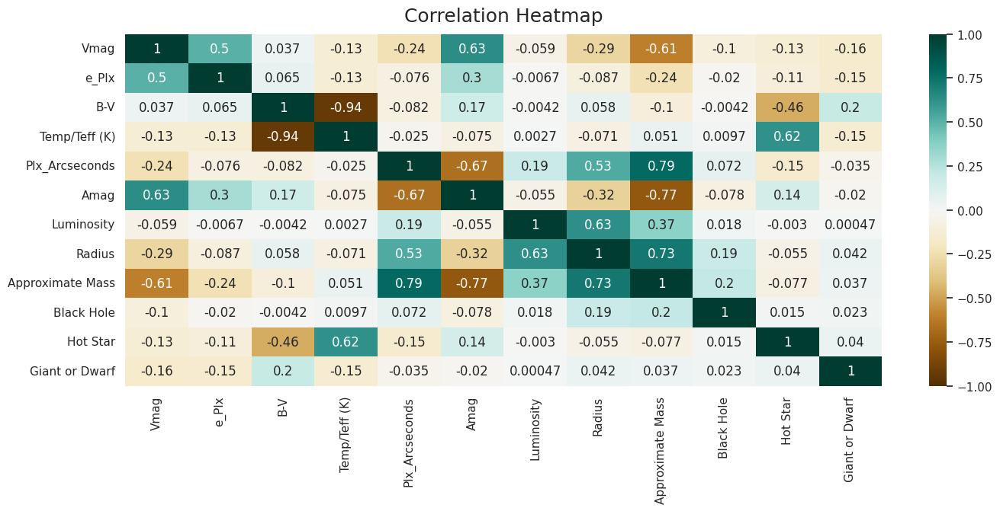

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Filter numerical columns
numerical_columns = df.select_dtypes(include=[np.number])

plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(numerical_columns.corr(), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize': 18}, pad=12)

plt.show()

## K-means Clustering

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



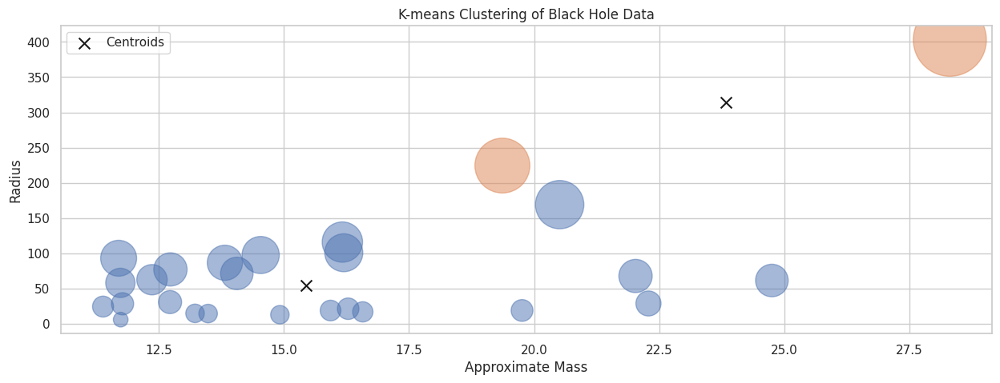

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

black_hole_rows = df[df['Black Hole'] == 1].copy()

# Select the features for clustering
features = black_hole_rows[['Approximate Mass', 'Radius']]

# Initialize KMeans with 3 centroids
num_clusters = 2
kmeans = KMeans(n_clusters=num_clusters)

# Fit KMeans to the features
kmeans.fit(features)

# Get the cluster labels
cluster_labels = kmeans.labels_

# Add the cluster labels back to the DataFrame using .loc to avoid the warning
black_hole_rows.loc[:, 'Cluster'] = cluster_labels

# Calculate bubble sizes based on higher Mass and Radius
bubble_sizes = (black_hole_rows['Approximate Mass'] + black_hole_rows['Radius']) * 10

# Plotting the clusters
plt.figure(figsize=(15, 5))

# Plotting scatter plot for each cluster and its label separately
for i in range(num_clusters):
    cluster_data = black_hole_rows[black_hole_rows['Cluster'] == i]
    plt.scatter(cluster_data['Approximate Mass'], cluster_data['Radius'], s=bubble_sizes[cluster_data.index], alpha=0.5, label=None)

# Plotting centroids
centroids = kmeans.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1], marker='x', s=100, c='k', label='Centroids')

plt.xlabel('Approximate Mass')
plt.ylabel('Radius')
plt.title('K-means Clustering of Black Hole Data')
plt.legend()
plt.grid(True)
plt.show()


## Random Forest Classification

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix, classification_report
from imblearn.over_sampling import SMOTE
from sklearn.metrics import accuracy_score

# Define features (X) and target (y)
X = df[['Plx_Arcseconds', 'B-V', 'Temp/Teff (K)', 'Amag', 'Luminosity', 'Radius', 'Approximate Mass']]
y = df['Black Hole']

In [ ]:
# Apply SMOTE to balance the dataset
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

In [ ]:
# Split the resampled dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Initialize and train the Random Forest classifier with class weights
random_forest = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
random_forest.fit(X_train, y_train)

# Predictions
y_pred_rf = random_forest.predict(X_test)

# Evaluation
accuracy = accuracy_score(y_test, y_pred_rf) * 100
precision = precision_score(y_test, y_pred_rf) * 100
recall = recall_score(y_test, y_pred_rf) * 100
f1 = f1_score(y_test, y_pred_rf) * 100
conf_matrix = confusion_matrix(y_test, y_pred_rf)
classification_rep = classification_report(y_test, y_pred_rf)

# Print evaluation metrics
print("Evaluation metrics for Random Forest Classifier:")
print(f"Accuracy: {accuracy:.2f}%")
print(f"Precision: {precision:.2f}%")
print(f"Recall: {recall:.2f}%")
print(f"F1-score: {f1:.2f}%")
print("Confusion Matrix:")
print(conf_matrix)
print("Classification Report:")
print(classification_rep)

Evaluation metrics for Random Forest Classifier:
Accuracy: 99.95%
Precision: 99.90%
Recall: 100.00%
F1-score: 99.95%
Confusion Matrix:
[[13049    13]
 [    0 12844]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     13062
           1       1.00      1.00      1.00     12844

    accuracy                           1.00     25906
   macro avg       1.00      1.00      1.00     25906
weighted avg       1.00      1.00      1.00     25906



## XGB

In [ ]:
# Apply SMOTE to balance the dataset
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

In [ ]:
from xgboost import XGBClassifier

# Split the resampled dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Initialize and train the XGB classifier with class weights
xgb = XGBClassifier(n_estimators=100, n_jobs=-1, random_state=42)
xgb.fit(X_train, y_train)

# Predictions
y_pred_rf = xgb.predict(X_test)

# Evaluation
accuracy = accuracy_score(y_test, y_pred_rf) * 100
precision = precision_score(y_test, y_pred_rf) * 100
recall = recall_score(y_test, y_pred_rf) * 100
f1 = f1_score(y_test, y_pred_rf) * 100
conf_matrix = confusion_matrix(y_test, y_pred_rf)
classification_rep = classification_report(y_test, y_pred_rf)

# Print evaluation metrics
print("Evaluation metrics for XGB Classifier:")
print(f"Accuracy: {accuracy:.2f}%")
print(f"Precision: {precision:.2f}%")
print(f"Recall: {recall:.2f}%")
print(f"F1-score: {f1:.2f}%")
print("Confusion Matrix:")
print(conf_matrix)
print("Classification Report:")
print(classification_rep)

Evaluation metrics for XGB Classifier:
Accuracy: 99.95%
Precision: 99.89%
Recall: 100.00%
F1-score: 99.95%
Confusion Matrix:
[[13048    14]
 [    0 12844]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     13062
           1       1.00      1.00      1.00     12844

    accuracy                           1.00     25906
   macro avg       1.00      1.00      1.00     25906
weighted avg       1.00      1.00      1.00     25906



## Gradient Boosting

In [ ]:
# Apply SMOTE to balance the dataset
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

# Split the resampled dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Initialize and train the Gradient Boosting Classifier with class weights
gbc = GradientBoostingClassifier(n_estimators=500, learning_rate=0.01, random_state=42)
gbc.fit(X_train, y_train)

# Predictions
y_pred_rf = gbc.predict(X_test)

# Evaluation
accuracy = accuracy_score(y_test, y_pred_rf) * 100
precision = precision_score(y_test, y_pred_rf) * 100
recall = recall_score(y_test, y_pred_rf) * 100
f1 = f1_score(y_test, y_pred_rf) * 100
conf_matrix = confusion_matrix(y_test, y_pred_rf)
classification_rep = classification_report(y_test, y_pred_rf)

# Print evaluation metrics
print("Evaluation metrics for Gradient Boosting Classifier:")
print(f"Accuracy: {accuracy:.2f}%")
print(f"Precision: {precision:.2f}%")
print(f"Recall: {recall:.2f}%")
print(f"F1-score: {f1:.2f}%")
print("Confusion Matrix:")
print(conf_matrix)
print("Classification Report:")
print(classification_rep)

Evaluation metrics for Gradient Boosting Classifier:
Accuracy: 99.94%
Precision: 99.88%
Recall: 100.00%
F1-score: 99.94%
Confusion Matrix:
[[13046    16]
 [    0 12844]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     13062
           1       1.00      1.00      1.00     12844

    accuracy                           1.00     25906
   macro avg       1.00      1.00      1.00     25906
weighted avg       1.00      1.00      1.00     25906



## Adaboost

In [ ]:
# Apply SMOTE to balance the dataset
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

# Split the resampled dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Initialize and train the Adaboost classifier with class weights
ada = AdaBoostClassifier(n_estimators=100, random_state=42, learning_rate=0.001)
ada.fit(X_train, y_train)

# Predictions
y_pred_rf = ada.predict(X_test)

# Evaluation
accuracy = accuracy_score(y_test, y_pred_rf) * 100
precision = precision_score(y_test, y_pred_rf) * 100
recall = recall_score(y_test, y_pred_rf) * 100
f1 = f1_score(y_test, y_pred_rf) * 100
conf_matrix = confusion_matrix(y_test, y_pred_rf)
classification_rep = classification_report(y_test, y_pred_rf)

# Print evaluation metrics
print("Evaluation metrics for Adaboost Classifier:")
print(f"Accuracy: {accuracy:.2f}%")
print(f"Precision: {precision:.2f}%")
print(f"Recall: {recall:.2f}%")
print(f"F1-score: {f1:.2f}%")
print("Confusion Matrix:")
print(conf_matrix)
print("Classification Report:")
print(classification_rep)

Evaluation metrics for Adaboost Classifier:
Accuracy: 99.89%
Precision: 99.77%
Recall: 100.00%
F1-score: 99.89%
Confusion Matrix:
[[13033    29]
 [    0 12844]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     13062
           1       1.00      1.00      1.00     12844

    accuracy                           1.00     25906
   macro avg       1.00      1.00      1.00     25906
weighted avg       1.00      1.00      1.00     25906



## Decision Tree

In [ ]:
# Apply SMOTE to balance the dataset
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

In [ ]:
from sklearn.tree import DecisionTreeClassifier

# Split the resampled dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Initialize and train the Decision Tree classifier with class weights
dtc = DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_split=10, random_state=42)
dtc.fit(X_train, y_train)

# Predictions
y_pred_rf = dtc.predict(X_test)

# Evaluation
accuracy = accuracy_score(y_test, y_pred_rf) * 100
precision = precision_score(y_test, y_pred_rf) * 100
recall = recall_score(y_test, y_pred_rf) * 100
f1 = f1_score(y_test, y_pred_rf) * 100
conf_matrix = confusion_matrix(y_test, y_pred_rf)
classification_rep = classification_report(y_test, y_pred_rf)

# Print evaluation metrics
print("Evaluation metrics for Decision Tree Classifier:")
print(f"Accuracy: {accuracy:.2f}%")
print(f"Precision: {precision:.2f}%")
print(f"Recall: {recall:.2f}%")
print(f"F1-score: {f1:.2f}%")
print("Confusion Matrix:")
print(conf_matrix)
print("Classification Report:")
print(classification_rep)

Evaluation metrics for Decision Tree Classifier:
Accuracy: 99.96%
Precision: 99.93%
Recall: 99.99%
F1-score: 99.96%
Confusion Matrix:
[[13053     9]
 [    1 12843]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     13062
           1       1.00      1.00      1.00     12844

    accuracy                           1.00     25906
   macro avg       1.00      1.00      1.00     25906
weighted avg       1.00      1.00      1.00     25906



## Gaussian NB

In [ ]:
# Apply SMOTE to balance the dataset
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

In [ ]:
from sklearn.naive_bayes import GaussianNB

# Split the resampled dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Initialize and train the GNB with class weights
gnb = GaussianNB()
gnb.fit(X_train, y_train)

# Predictions
y_pred_rf = gnb.predict(X_test)

# Evaluation
accuracy = accuracy_score(y_test, y_pred_rf) * 100
precision = precision_score(y_test, y_pred_rf) * 100
recall = recall_score(y_test, y_pred_rf) * 100
f1 = f1_score(y_test, y_pred_rf) * 100
conf_matrix = confusion_matrix(y_test, y_pred_rf)
classification_rep = classification_report(y_test, y_pred_rf)

# Print evaluation metrics
print("Evaluation metrics for GNB:")
print(f"Accuracy: {accuracy:.2f}%")
print(f"Precision: {precision:.2f}%")
print(f"Recall: {recall:.2f}%")
print(f"F1-score: {f1:.2f}%")
print("Confusion Matrix:")
print(conf_matrix)
print("Classification Report:")
print(classification_rep)

Evaluation metrics for GNB:
Accuracy: 99.34%
Precision: 98.69%
Recall: 100.00%
F1-score: 99.34%
Confusion Matrix:
[[12891   171]
 [    0 12844]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     13062
           1       0.99      1.00      0.99     12844

    accuracy                           0.99     25906
   macro avg       0.99      0.99      0.99     25906
weighted avg       0.99      0.99      0.99     25906



## Dummy Classifer

In [ ]:
# Apply SMOTE to balance the dataset
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

In [ ]:
from sklearn.dummy import DummyClassifier

# Split the resampled dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Initialize and train the Dummy Classifier with class weights
dc = DummyClassifier(strategy='uniform')
dc.fit(X_train, y_train)

# Predictions
y_pred_rf = dc.predict(X_test)

# Evaluation
accuracy = accuracy_score(y_test, y_pred_rf) * 100
precision = precision_score(y_test, y_pred_rf) * 100
recall = recall_score(y_test, y_pred_rf) * 100
f1 = f1_score(y_test, y_pred_rf) * 100
conf_matrix = confusion_matrix(y_test, y_pred_rf)
classification_rep = classification_report(y_test, y_pred_rf)

# Print evaluation metrics
print("Evaluation metrics for Dummy Classifier:")
print(f"Accuracy: {accuracy:.2f}%")
print(f"Precision: {precision:.2f}%")
print(f"Recall: {recall:.2f}%")
print(f"F1-score: {f1:.2f}%")
print("Confusion Matrix:")
print(conf_matrix)
print("Classification Report:")
print(classification_rep)

Evaluation metrics for Dummy Classifier:
Accuracy: 49.83%
Precision: 49.41%
Recall: 49.92%
F1-score: 49.66%
Confusion Matrix:
[[6496 6566]
 [6432 6412]]
Classification Report:
              precision    recall  f1-score   support

           0       0.50      0.50      0.50     13062
           1       0.49      0.50      0.50     12844

    accuracy                           0.50     25906
   macro avg       0.50      0.50      0.50     25906
weighted avg       0.50      0.50      0.50     25906



## KNN

In [ ]:
# Apply SMOTE to balance the dataset
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

# Split the resampled dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Initialize and train the KNN Classifier with class weights
knn = KNeighborsClassifier(n_jobs=-1, n_neighbors=10)
knn.fit(X_train, y_train)

# Predictions
y_pred_rf = knn.predict(X_test)

# Evaluation
accuracy = accuracy_score(y_test, y_pred_rf) * 100
precision = precision_score(y_test, y_pred_rf) * 100
recall = recall_score(y_test, y_pred_rf) * 100
f1 = f1_score(y_test, y_pred_rf) * 100
conf_matrix = confusion_matrix(y_test, y_pred_rf)
classification_rep = classification_report(y_test, y_pred_rf)

# Print evaluation metrics
print("Evaluation metrics for KNN Classifier:")
print(f"Accuracy: {accuracy:.2f}%")
print(f"Precision: {precision:.2f}%")
print(f"Recall: {recall:.2f}%")
print(f"F1-score: {f1:.2f}%")
print("Confusion Matrix:")
print(conf_matrix)
print("Classification Report:")
print(classification_rep)

Evaluation metrics for KNN Classifier:
Accuracy: 99.88%
Precision: 99.76%
Recall: 100.00%
F1-score: 99.88%
Confusion Matrix:
[[13031    31]
 [    0 12844]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     13062
           1       1.00      1.00      1.00     12844

    accuracy                           1.00     25906
   macro avg       1.00      1.00      1.00     25906
weighted avg       1.00      1.00      1.00     25906



## LGBM

In [ ]:
# Apply SMOTE to balance the dataset
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

In [ ]:
import lightgbm as lgb

# Split the resampled dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Initialize and train the LGBM Classifier with class weights
lgbm = lgb.LGBMClassifier(learning_rate=0.05, max_depth=10, random_state=42)
lgbm.fit(X_train, y_train, eval_set=[(X_test,y_test),(X_train,y_train)], eval_metric='logloss')

# Predictions
y_pred_rf = lgbm.predict(X_test)

# Evaluation
accuracy = accuracy_score(y_test, y_pred_rf) * 100
precision = precision_score(y_test, y_pred_rf) * 100
recall = recall_score(y_test, y_pred_rf) * 100
f1 = f1_score(y_test, y_pred_rf) * 100
conf_matrix = confusion_matrix(y_test, y_pred_rf)
classification_rep = classification_report(y_test, y_pred_rf)

# Print evaluation metrics
print("Evaluation metrics for LGBM Classifier:")
print(f"Accuracy: {accuracy:.2f}%")
print(f"Precision: {precision:.2f}%")
print(f"Recall: {recall:.2f}%")
print(f"F1-score: {f1:.2f}%")
print("Confusion Matrix:")
print(conf_matrix)
print("Classification Report:")
print(classification_rep)

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning:


Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.




[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 51919, number of negative: 51701
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009019 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1785
[LightGBM] [Info] Number of data points in the train set: 103620, number of used features: 7
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501052 -> initscore=0.004208
[LightGBM] [Info] Start training from score 0.004208
Evaluation metrics for LGBM Classifier:
Accuracy: 99.95%
Precision: 99.89%
Recall: 100.00%
F1-score: 99.95%
Confusion Matrix:
[[13048    14]
 [    0 12844]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     13062
           1       1.00      1.00      1.00     12844

    

<Axes: title={'center': 'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

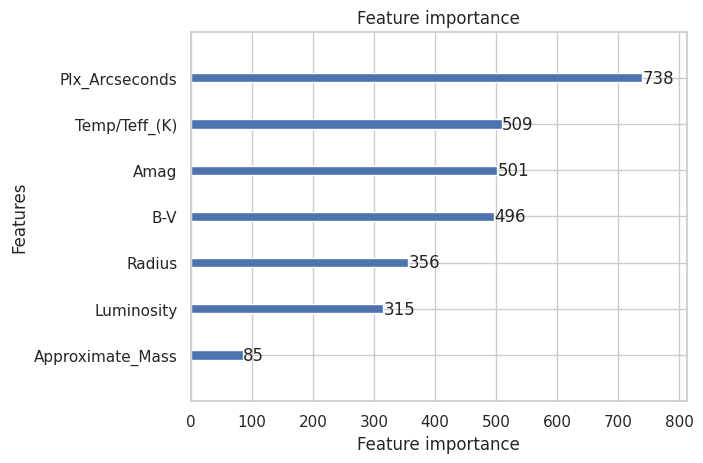

In [ ]:
# Plot feature importance
lgb.plot_importance(lgbm)

<Axes: title={'center': 'Metric during training'}, xlabel='Iterations', ylabel='binary_logloss'>

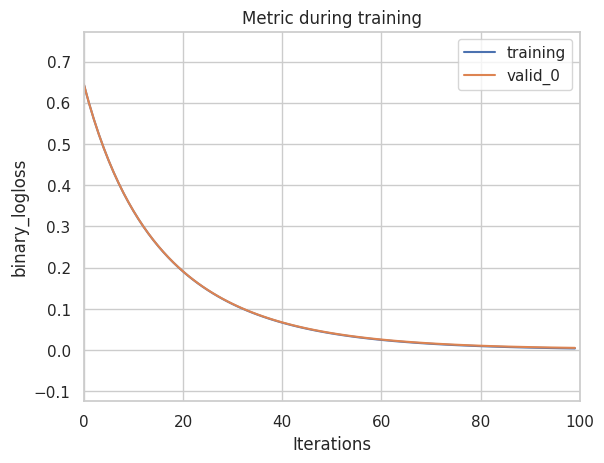

In [ ]:
# Plot validation curve
lgb.plot_metric(lgbm)

## Catboost

In [ ]:
# Apply SMOTE to balance the dataset
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

In [ ]:
from catboost import CatBoostClassifier
from sklearn.metrics import roc_auc_score as ras

# Split the resampled dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Initialize and train the Catboost Classifier with class weights
cat = CatBoostClassifier(verbose=100, iterations=5000, learning_rate=0.01, loss_function='Logloss', early_stopping_rounds=100, custom_metric=['AUC'])

cat.fit(X_train, y_train, eval_set=[(X_test,y_test),(X_train,y_train)])

# Predictions
y_train_rf = cat.predict(X_train)
y_pred_rf = cat.predict(X_test)

# Evaluation
accuracy = accuracy_score(y_test, y_pred_rf) * 100
precision = precision_score(y_test, y_pred_rf) * 100
recall = recall_score(y_test, y_pred_rf) * 100
f1 = f1_score(y_test, y_pred_rf) * 100
conf_matrix = confusion_matrix(y_test, y_pred_rf)
classification_rep = classification_report(y_test, y_pred_rf)

# Print evaluation metrics
print("Evaluation metrics for Catboost Classifier:")
print(f"Accuracy: {accuracy:.2f}%")
print(f"Precision: {precision:.2f}%")
print(f"Recall: {recall:.2f}%")
print(f"F1-score: {f1:.2f}%")
print("Training ROC-AUC: ", ras(y_train, y_train_rf))
print("Validation ROC-AUC: ", ras(y_test, y_pred_rf))
print("Confusion Matrix:")
print(conf_matrix)
print("Classification Report:")
print(classification_rep)

0:	learn: 0.6585189	test: 0.6584925	test1: 0.6585661	best: 0.6585661 (0)	total: 135ms	remaining: 11m 12s
100:	learn: 0.0088775	test: 0.0095239	test1: 0.0088804	best: 0.0088804 (100)	total: 5.15s	remaining: 4m 9s
200:	learn: 0.0032645	test: 0.0043423	test1: 0.0032656	best: 0.0032656 (200)	total: 8.95s	remaining: 3m 33s
300:	learn: 0.0025615	test: 0.0037466	test1: 0.0025625	best: 0.0025625 (300)	total: 13.5s	remaining: 3m 31s
400:	learn: 0.0023650	test: 0.0035362	test1: 0.0023660	best: 0.0023660 (400)	total: 18.9s	remaining: 3m 36s
500:	learn: 0.0022846	test: 0.0034758	test1: 0.0022855	best: 0.0022855 (497)	total: 22.4s	remaining: 3m 20s
600:	learn: 0.0022296	test: 0.0034095	test1: 0.0022307	best: 0.0022307 (600)	total: 25.9s	remaining: 3m 9s
700:	learn: 0.0021874	test: 0.0033762	test1: 0.0021884	best: 0.0021884 (700)	total: 31.7s	remaining: 3m 14s
800:	learn: 0.0021207	test: 0.0033219	test1: 0.0021216	best: 0.0021216 (799)	total: 35.2s	remaining: 3m 4s
900:	learn: 0.0020903	test: 0.0032

## ANN

In [ ]:
# Apply SMOTE to balance the dataset
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

In [ ]:
from tensorflow.keras import Model
from tensorflow.keras import Sequential
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.losses import MeanSquaredLogarithmicError

# Split the resampled dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Initialize and train the ANN Classifier with class weights
ann = Sequential()
ann.add(Dense(units = 64, activation = 'relu'))
ann.add(Dense(units = 32, activation = 'relu'))
ann.add(Dense(units = 1, activation = 'sigmoid'))

ann.compile(optimizer='adam', loss='mean_squared_logarithmic_error', metrics= ['accuracy'])
ann.fit(X_train, y_train, epochs=5, batch_size=32)

Epoch 1/5
3239/3239 ━━━━━━━━━━━━━━━━━━━━ 9s 2ms/step - accuracy: 0.5004 - loss: 0.2429
Epoch 2/5
3239/3239 ━━━━━━━━━━━━━━━━━━━━ 9s 2ms/step - accuracy: 0.4971 - loss: 0.2416
Epoch 3/5
3239/3239 ━━━━━━━━━━━━━━━━━━━━ 8s 2ms/step - accuracy: 0.5012 - loss: 0.2396
Epoch 4/5
3239/3239 ━━━━━━━━━━━━━━━━━━━━ 8s 2ms/step - accuracy: 0.4987 - loss: 0.2408
Epoch 5/5
3239/3239 ━━━━━━━━━━━━━━━━━━━━ 8s 2ms/step - accuracy: 0.4983 - loss: 0.2411


In [ ]:
# Predictions
y_pred_rf = ann.predict(X_test)
y_pred_rf = (y_pred_rf > 0.5)

810/810 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


In [ ]:
# Evaluation
accuracy = accuracy_score(y_test, y_pred_rf) * 100
precision = precision_score(y_test, y_pred_rf) * 100
recall = recall_score(y_test, y_pred_rf) * 100
f1 = f1_score(y_test, y_pred_rf) * 100
conf_matrix = confusion_matrix(y_test, y_pred_rf)
classification_rep = classification_report(y_test, y_pred_rf)

# Print evaluation metrics
print("Evaluation metrics for ANN Classifier:")
print(f"Accuracy: {accuracy:.2f}%")
print(f"Precision: {precision:.2f}%")
print(f"Recall: {recall:.2f}%")
print(f"F1-score: {f1:.2f}%")
print("Confusion Matrix:")
print("Classification Report:")
print(classification_rep)
#sns.heatmap(confusion_matrix(y_test, y_pred_rf), annot=True, fmt='', cmap='YlGnBu')

Evaluation metrics for ANN Classifier:
Accuracy: 50.42%
Precision: 0.00%
Recall: 0.00%
F1-score: 0.00%
Confusion Matrix:
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67     13062
           1       0.00      0.00      0.00     12844

    accuracy                           0.50     25906
   macro avg       0.25      0.50      0.34     25906
weighted avg       0.25      0.50      0.34     25906



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control t

<Axes: >

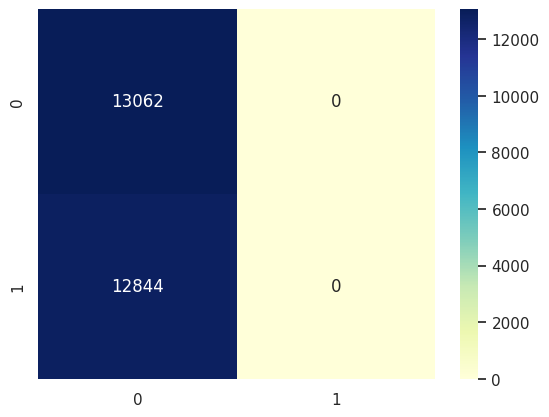

In [ ]:
sns.heatmap(confusion_matrix(y_test, y_pred_rf), annot=True, fmt='', cmap='YlGnBu')

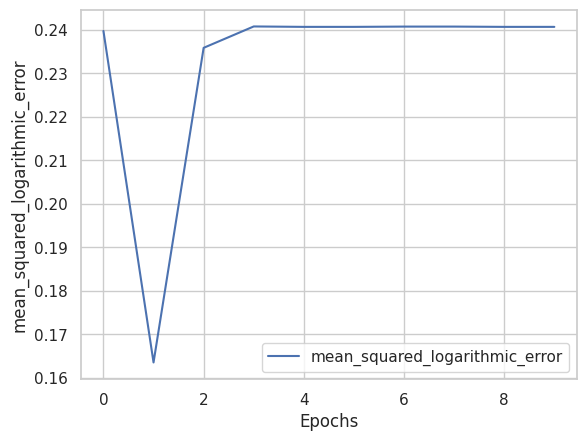

In [ ]:
def plot_history(history, key):
  plt.plot(history.history[key])
  plt.xlabel("Epochs")
  plt.ylabel(key)
  plt.legend([key, 'val_'+key])
  plt.show()
# Plot the history
plot_history(history, 'mean_squared_logarithmic_error')